In [1]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns

## Read in Data 

First, we can list all the available data files. There are a total of 9 files: 1 main file for training (with target) 1 main file for testing (without the target), 1 example submission file, and 6 other files containing additional information about each loan. 

In [2]:
# List files available
print(os.listdir("data/"))

['application_test.csv', 'application_train.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_submission.csv']


In [3]:
# Training data
app_train = pd.read_csv('data/application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
app_train['DAYS_EMPLOYED']

0           -637
1          -1188
2           -225
3          -3039
4          -3038
           ...  
307506      -236
307507    365243
307508     -7921
307509     -4786
307510     -1262
Name: DAYS_EMPLOYED, Length: 307511, dtype: int64

The training data has 307511 observations (each one a separate loan) and 122 features (variables) including the `TARGET` (the label we want to predict).

In [5]:
# Testing data features
app_test = pd.read_csv('data/application_test.csv')
print('Testing data shape: ', app_test.shape)
app_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The test set is considerably smaller and lacks a `TARGET` column. 

# Exploratory Data Analysis

Exploratory Data Analysis (EDA) is an open-ended process where we calculate statistics and make figures to find trends, anomalies, patterns, or relationships within the data. The goal of EDA is to learn what our data can tell us. It generally starts out with a high level overview, then narrows in to specific areas as we find intriguing areas of the data. The findings may be interesting in their own right, or they can be used to inform our modeling choices, such as by helping us decide which features to use.

## Examine the Distribution of the Target Column

The target is what we are asked to predict: either a 0 for the loan was repaid on time, or a 1 indicating the client had payment difficulties. We can first examine the number of loans falling into each category.

In [6]:
app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

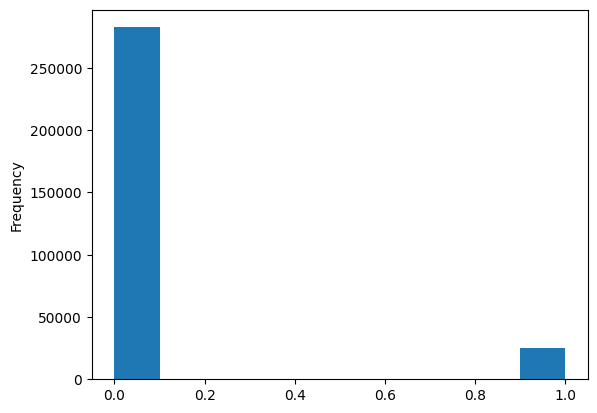

In [7]:
app_train['TARGET'].astype(int).plot.hist();

From this information, we see this is an [_imbalanced class problem_](http://www.chioka.in/class-imbalance-problem/). There are far more loans that were repaid on time than loans that were not repaid. Once we get into more sophisticated machine learning models, we can [weight the classes](http://xgboost.readthedocs.io/en/latest/parameter.html) by their representation in the data to reflect this imbalance. 

## Examine Missing Values

Next we can look at the number and percentage of missing values in each column. 

In [8]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [9]:
# Missing values statistics
missing_values = missing_values_table(app_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


When it comes time to build our machine learning models, we will have to fill in these missing values (known as imputation). In later work, we will use models such as XGBoost that can [handle missing values with no need for imputation](https://stats.stackexchange.com/questions/235489/xgboost-can-handle-missing-data-in-the-forecasting-phase). Another option would be to drop columns with a high percentage of missing values, although it is impossible to know ahead of time if these columns will be helpful to our model. Therefore, we will keep all of the columns for now.

## Column Types

Let's look at the number of columns of each data type. `int64` and `float64` are numeric variables ([which can be either discrete or continuous](https://stats.stackexchange.com/questions/206/what-is-the-difference-between-discrete-data-and-continuous-data)). `object` columns contain strings and are  [categorical features.](http://support.minitab.com/en-us/minitab-express/1/help-and-how-to/modeling-statistics/regression/supporting-topics/basics/what-are-categorical-discrete-and-continuous-variables/) . 

In [10]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
Name: count, dtype: int64

Let's now look at the number of unique entries in each of the `object` (categorical) columns.

In [11]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

Most of the categorical variables have a relatively small number of unique entries. We will need to find a way to deal with these categorical variables! 

In [12]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in app_train:
    if app_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(app_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(app_train[col])
            # Transform both training and testing data
            app_train[col] = le.transform(app_train[col])
            app_test[col] = le.transform(app_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

3 columns were label encoded.


In [13]:
# Récupérer les colonnes catégorielles pour le codage à chaud
categorical_cols = app_train.select_dtypes(include=['object']).columns

# Effectuer le codage à chaud avec les noms de colonnes préfixés
app_train = pd.get_dummies(app_train, prefix=categorical_cols, prefix_sep='_')
app_test = pd.get_dummies(app_test, prefix=categorical_cols, prefix_sep='_')


print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 239)


### Aligning Training and Testing Data

There need to be the same features (columns) in both the training and testing data. One-hot encoding has created more columns in the training data because there were some categorical variables with categories not represented in the testing data. To remove the columns in the training data that are not in the testing data, we need to `align` the dataframes. First we extract the target column from the training data (because this is not in the testing data but we need to keep this information). When we do the align, we must make sure to set `axis = 1` to align the dataframes based on the columns and not on the rows!

In [14]:
train_labels = app_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
app_train, app_test = app_train.align(app_test, join = 'inner', axis = 1)

# Add the target back in
app_train['TARGET'] = train_labels

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)


Training Features shape:  (307511, 240)
Testing Features shape:  (48744, 239)


In [15]:
app_test.shape

(48744, 239)

The training and testing datasets now have the same features which is required for machine learning. The number of features has grown significantly due to one-hot encoding. At some point we probably will want to try [dimensionality reduction (removing features that are not relevant)](https://en.wikipedia.org/wiki/Dimensionality_reduction) to reduce the size of the datasets.

## Back to Exploratory Data Analysis

### Anomalies

One problem we always want to be on the lookout for when doing EDA is anomalies within the data. These may be due to mis-typed numbers, errors in measuring equipment, or they could be valid but extreme measurements. One way to support anomalies quantitatively is by looking at the statistics of a column using the `describe` method. The numbers in the `DAYS_BIRTH` column are negative because they are recorded relative to the current loan application. To see these stats in years, we can mutliple by -1 and divide by the number of days in a year:



In [16]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

Those ages look reasonable. There are no outliers for the age on either the high or low end. How about the days of employment? 

In [17]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

That doesn't look right! The maximum value (besides being positive) is about 1000 years! 

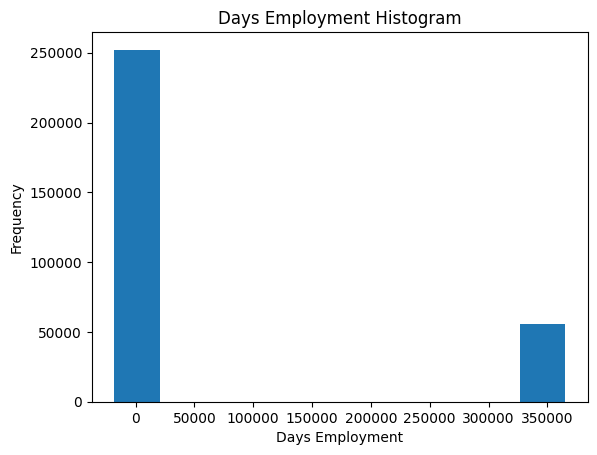

In [18]:
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

Just out of curiousity, let's subset the anomalous clients and see if they tend to have higher or low rates of default than the rest of the clients.

In [19]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


Well that is extremely interesting! It turns out that the anomalies have a lower rate of default. 

Handling the anomalies depends on the exact situation, with no set rules. One of the safest approaches is just to set the anomalies to a missing value and then have them filled in (using Imputation) before machine learning. In this case, since all the anomalies have the exact same value, we want to fill them in with the same value in case all of these loans share something in common. The anomalous values seem to have some importance, so we want to tell the machine learning model if we did in fact fill in these values. As a solution, we will fill in the anomalous values with not a number (`np.nan`) and then create a new boolean column indicating whether or not the value was anomalous.



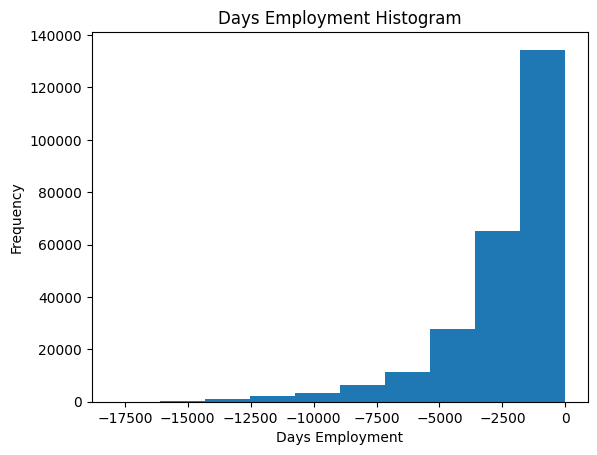

In [20]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

The distribution looks to be much more in line with what we would expect, and we also have created a new column to tell the model that these values were originally anomalous (becuase we will have to fill in the nans with some value, probably the median of the column). The other columns with `DAYS` in the dataframe look to be about what we expect with no obvious outliers. 

As an extremely important note, anything we do to the training data we also have to do to the testing data. Let's make sure to create the new column and fill in the existing column with `np.nan` in the testing data.

In [21]:
app_test['DAYS_EMPLOYED_ANOM'] = app_test["DAYS_EMPLOYED"] == 365243
app_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (app_test["DAYS_EMPLOYED_ANOM"].sum(), len(app_test)))

There are 9274 anomalies in the test data out of 48744 entries


### Correlations

Now that we have dealt with the categorical variables and the outliers, let's continue with the EDA. One way to try and understand the data is by looking for correlations between the features and the target. We can calculate the Pearson correlation coefficient between every variable and the target using the `.corr` dataframe method.

The correlation coefficient is not the greatest method to represent "relevance" of a feature, but it does give us an idea of possible relationships within the data. Some [general interpretations of the absolute value of the correlation coefficent](http://www.statstutor.ac.uk/resources/uploaded/pearsons.pdf) are:


* .00-.19 “very weak”
*  .20-.39 “weak”
*  .40-.59 “moderate”
*  .60-.79 “strong”
* .80-1.0 “very strong”


In [22]:
# Find correlations with the target and sort
correlations = app_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Most Negati

Let's take a look at some of more significant correlations: the `DAYS_BIRTH` is the most positive correlation. (except for `TARGET` because the correlation of a variable with itself is always 1!) Looking at the documentation, `DAYS_BIRTH` is the age in days of the client at the time of the loan in negative days (for whatever reason!). The correlation is positive, but the value of this feature is actually negative, meaning that as the client gets older, they are less likely to default on their loan (ie the target == 0). That's a little confusing, so we will take the absolute value of the feature and then the correlation will be negative.

### Effect of Age on Repayment

In [ ]:
# Find the correlation of the positive days since birth and target
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

As the client gets older, there is a negative linear relationship with the target meaning that as clients get older, they tend to repay their loans on time more often. 

Let's start looking at this variable. First, we can make a histogram of the age. We will put the x axis in years to make the plot a little more understandable.

In [ ]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

By itself, the distribution of age does not tell us much other than that there are no outliers as all the ages are reasonable. To visualize the effect of the age on the target, we will next make a [kernel density estimation plot](https://en.wikipedia.org/wiki/Kernel_density_estimation) (KDE) colored by the value of the target. A [kernel density estimate plot shows the distribution of a single variable](https://chemicalstatistician.wordpress.com/2013/06/09/exploratory-data-analysis-kernel-density-estimation-in-r-on-ozone-pollution-data-in-new-york-and-ozonopolis/) and can be thought of as a smoothed histogram (it is created by computing a kernel, usually a Gaussian, at each data point and then averaging all the individual kernels to develop a single smooth curve). We will use the seaborn `kdeplot` for this graph.

In [ ]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

The target == 1 curve skews towards the younger end of the range. Although this is not a significant correlation (-0.07 correlation coefficient), this variable is likely going to be useful in a machine learning model because it does affect the target. Let's look at this relationship in another way: average failure to repay loans by age bracket. 

To make this graph, first we `cut` the age category into bins of 5 years each. Then, for each bin, we calculate the average value of the target, which tells us the ratio of loans that were not repaid in each age category.

In [ ]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

In [ ]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

In [ ]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

There is a clear trend: younger applicants are more likely to not repay the loan! The rate of failure to repay is above 10% for the youngest three age groups and beolow 5% for the oldest age group.

This is information that could be directly used by the bank: because younger clients are less likely to repay the loan, maybe they should be provided with more guidance or financial planning tips. This does not mean the bank should discriminate against younger clients, but it would be smart to take precautionary measures to help younger clients pay on time.

### Exterior Sources

The 3 variables with the strongest negative correlations with the target are `EXT_SOURCE_1`, `EXT_SOURCE_2`, and `EXT_SOURCE_3`.
According to the documentation, these features represent a "normalized score from external data source". I'm not sure what this exactly means, but it may be a cumulative sort of credit rating made using numerous sources of data. 

Let's take a look at these variables.

First, we can show the correlations of the `EXT_SOURCE` features with the target and with each other.

In [ ]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

In [ ]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

All three `EXT_SOURCE` featureshave negative correlations with the target, indicating that as the value of the `EXT_SOURCE` increases, the client is more likely to repay the loan. We can also see that `DAYS_BIRTH` is positively correlated with `EXT_SOURCE_1` indicating that maybe one of the factors in this score is the client age.

Next we can look at the distribution of each of these features colored by the value of the target. This will let us visualize the effect of this variable on the target.

In [ ]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)
    

`EXT_SOURCE_3` displays the greatest difference between the values of the target. We can clearly see that this feature has some relationship to the likelihood of an applicant to repay a loan. The relationship is not very strong (in fact they are all [considered very weak](http://www.statstutor.ac.uk/resources/uploaded/pearsons.pdf), but these variables will still be useful for a machine learning model to predict whether or not an applicant will repay a loan on time.

## Pairs Plot

As a final exploratory plot, we can make a pairs plot of the `EXT_SOURCE` variables and the `DAYS_BIRTH` variable. The [Pairs Plot](https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166) is a great exploration tool because it lets us see relationships between multiple pairs of variables as well as distributions of single variables. Here we are using the seaborn visualization library and the PairGrid function to create a Pairs Plot with scatterplots on the upper triangle, histograms on the diagonal, and 2D kernel density plots and correlation coefficients on the lower triangle.

If you don't understand this code, that's all right! Plotting in Python can be overly complex, and for anything beyond the simplest graphs, I usually find an existing implementation and adapt the code (don't repeat yourself)! 

In [ ]:
# Copy the data for plotting
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)
 
# Create the pairgrid object
grid = sns.PairGrid(data=plot_data, height=3, diag_sharey=False,
                    hue='TARGET',
                    vars=[x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

In this plot, the red indicates loans that were not repaid and the blue are loans that are paid. We can see the different relationships within the data. There does appear to be a moderate positive linear relationship between the `EXT_SOURCE_1` and the `DAYS_BIRTH` (or equivalently `YEARS_BIRTH`), indicating that this feature may take into account the age of the client. 

# Feature Engineering

Kaggle competitions are won by feature engineering: those win are those who can create the most useful features out of the data. (This is true for the most part as the winning models, at least for structured data, all tend to be variants on [gradient boosting](http://blog.kaggle.com/2017/01/23/a-kaggle-master-explains-gradient-boosting/)). This represents one of the patterns in machine learning: feature engineering has a greater return on investment than model building and hyperparameter tuning. [This is a great article on the subject)](https://www.featurelabs.com/blog/secret-to-data-science-success/). As Andrew Ng is fond of saying: "applied machine learning is basically feature engineering." 

While choosing the right model and optimal settings are important, the model can only learn from the data it is given. Making sure this data is as relevant to the task as possible is the job of the data scientist (and maybe some [automated tools](https://docs.featuretools.com/getting_started/install.html) to help us out).

Feature engineering refers to a geneal process and can involve both feature construction: adding new features from the existing data, and feature selection: choosing only the most important features or other methods of dimensionality reduction. There are many techniques we can use to both create features and select features.

We will do a lot of feature engineering when we start using the other data sources, but in this notebook we will try only two simple feature construction methods: 

* Polynomial features
* Domain knowledge features


## Polynomial Features

One simple feature construction method is called [polynomial features](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html). In this method, we make features that are powers of existing features as well as interaction terms between existing features. For example, we can create variables `EXT_SOURCE_1^2` and `EXT_SOURCE_2^2` and also variables such as `EXT_SOURCE_1` x `EXT_SOURCE_2`, `EXT_SOURCE_1` x `EXT_SOURCE_2^2`, `EXT_SOURCE_1^2` x   `EXT_SOURCE_2^2`, and so on. These features that are a combination of multiple individual variables are called [interaction terms](https://en.wikipedia.org/wiki/Interaction_(statistics) because they  capture the interactions between variables. In other words, while two variables by themselves  may not have a strong influence on the target, combining them together into a single interaction variable might show a relationship with the target. [Interaction terms are commonly used in statistical models](https://www.theanalysisfactor.com/interpreting-interactions-in-regression/) to capture the effects of multiple variables, but I do not see them used as often in machine learning. Nonetheless, we can try out a few to see if they might help our model to predict whether or not a client will repay a loan. 

Jake VanderPlas writes about [polynomial features in his excellent book Python for Data Science](https://jakevdp.github.io/PythonDataScienceHandbook/05.04-feature-engineering.html) for those who want more information.

In the following code, we create polynomial features using the `EXT_SOURCE` variables and the `DAYS_BIRTH` variable. [Scikit-Learn has a useful class called `PolynomialFeatures`](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html) that creates the polynomials and the interaction terms up to a specified degree. We can use a degree of 3 to see the results (when we are creating polynomial features, we want to avoid using too high of a degree, both because the number of features scales exponentially with the degree, and because we can run into [problems with overfitting](http://scikit-learn.org/stable/auto_examples/model_selection/plot_underfitting_overfitting.html#sphx-glr-auto-examples-model-selection-plot-underfitting-overfitting-py)). 

In [ ]:
# Make a new dataframe for polynomial features
poly_features = app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]
poly_features_test = app_test[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# imputer for handling missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = 'median')

poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)
poly_features_test = imputer.transform(poly_features_test)

from sklearn.preprocessing import PolynomialFeatures
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)

In [ ]:
# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
poly_features_test = poly_transformer.transform(poly_features_test)
print('Polynomial Features shape: ', poly_features.shape)

This creates a considerable number of new features. To get the names we have to use the polynomial features `get_feature_names` method.

In [ ]:
poly_transformer.get_feature_names_out(input_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'])[:15]

There are 35 features with individual features raised to powers up to degree 3 and interaction terms. Now, we can see whether any of these new features are correlated with the target.

In [ ]:
# Create a dataframe of the features 
poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                           'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(5))

Several of the new variables have a greater (in terms of absolute magnitude) correlation with the target than the original features. When we build machine learning models, we can try with and without these features to determine if they actually help the model learn. 

We will add these features to a copy of the training and testing data and then evaluate models with and without the features. Many times in machine learning, the only way to know if an approach will work is to try it out! 

In [ ]:
# Put test features into dataframe
poly_features_test = pd.DataFrame(poly_features_test, 
                                  columns = poly_transformer.get_feature_names_out(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                                'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Merge polynomial features into training dataframe
poly_features['SK_ID_CURR'] = app_train['SK_ID_CURR']
app_train_poly = app_train.merge(poly_features, on = 'SK_ID_CURR', how = 'left')

# Merge polnomial features into testing dataframe
poly_features_test['SK_ID_CURR'] = app_test['SK_ID_CURR']
app_test_poly = app_test.merge(poly_features_test, on = 'SK_ID_CURR', how = 'left')

# Align the dataframes
app_train_poly, app_test_poly = app_train_poly.align(app_test_poly, join = 'inner', axis = 1)

# Print out the new shapes
print('Training data with polynomial features shape: ', app_train_poly.shape)
print('Testing data with polynomial features shape:  ', app_test_poly.shape)

## Domain Knowledge Features

Maybe it's not entirely correct to call this "domain knowledge" because I'm not a credit expert, but perhaps we could call this "attempts at applying limited financial knowledge". In this frame of mind, we can make a couple features that attempt to capture what we think may be important for telling whether a client will default on a loan. Here I'm going to use five features that were inspired by [this script](https://www.kaggle.com/jsaguiar/updated-0-792-lb-lightgbm-with-simple-features) by Aguiar:

* `CREDIT_INCOME_PERCENT`: the percentage of the credit amount relative to a client's income
* `ANNUITY_INCOME_PERCENT`: the percentage of the loan annuity relative to a client's income
* `CREDIT_TERM`:  the length of the payment in months (since the annuity is the monthly amount due
* `DAYS_EMPLOYED_PERCENT`: the percentage of the days employed relative to the client's age

Again, thanks to Aguiar and [his great script](https://www.kaggle.com/jsaguiar/updated-0-792-lb-lightgbm-with-simple-features) for exploring these features.



In [ ]:
app_train_domain = app_train.copy()
app_test_domain = app_test.copy()

app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']

In [ ]:
app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']
app_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']

#### Visualize New Variables

We should explore these __domain knowledge__ variables visually in a graph. For all of these, we will make the same KDE plot colored by the value of the `TARGET`.

In [ ]:
plt.figure(figsize = (12, 20))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

In [18]:
app_train

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,TARGET
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,False,False,False,False,False,True,False,True,False,1
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,True,False,False,False,False,False,False,True,False,0
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,False,False,False,False,False,False,False,False,False,0
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,False,False,False,False,False,False,False,False,False,0
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,False,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,0,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,...,False,False,False,False,False,True,False,True,False,0
307507,456252,0,0,1,0,72000.0,269550.0,12001.5,225000.0,0.025164,...,False,False,False,False,False,True,False,True,False,0
307508,456253,0,0,1,0,153000.0,677664.0,29979.0,585000.0,0.005002,...,False,False,False,False,True,False,False,True,False,0
307509,456254,0,0,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,...,False,False,False,False,False,True,False,True,False,1


# Baseline



In [23]:

train = app_train.drop(['TARGET','SK_ID_CURR'],axis=1)

from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

# Imputation médiane des valeurs manquantes
imputer = SimpleImputer(strategy='median')

# Mise à l'échelle de chaque caractéristique de 0 à 1
scaler = MinMaxScaler(feature_range=(0, 1))

# Sauvegarder les noms des colonnes de app_train
train_columns = train.columns

# Ajuster et transformer les données d'entraînement
train = imputer.fit_transform(train)
train = scaler.fit_transform(train)

# Recréer le DataFrame avec les noms des colonnes
train = pd.DataFrame(train, columns=train_columns)


print('Training data shape: ', train.shape)


Training data shape:  (307511, 239)


In [24]:
from sklearn.model_selection import train_test_split
# Diviser les données en train et test
X_train, X_test, y_train, y_test = train_test_split(train, train_labels, test_size=0.2, random_state=42)

In [31]:
X_test

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,DAYS_EMPLOYED_ANOM
245895,0.0,1.0,0.0,0.105263,0.001550,0.104983,0.199000,0.094276,0.129331,0.672604,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
98194,0.0,1.0,1.0,0.000000,0.001897,0.308792,0.184591,0.283951,0.090864,0.589121,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
36463,0.0,1.0,0.0,0.000000,0.001512,0.112360,0.146227,0.113356,0.491595,0.412740,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
249923,0.0,0.0,1.0,0.000000,0.001897,0.052360,0.090962,0.046016,0.635991,0.315840,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
158389,0.0,0.0,1.0,0.000000,0.000742,0.065701,0.055563,0.048260,0.257000,0.276325,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256564,1.0,1.0,1.0,0.105263,0.003628,0.213483,0.169200,0.214366,0.045016,0.372435,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
278889,0.0,0.0,1.0,0.000000,0.001704,0.039326,0.087417,0.040404,0.392880,0.727396,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
221828,0.0,0.0,1.0,0.000000,0.000819,0.052360,0.112092,0.046016,0.048852,0.090192,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
190245,0.0,1.0,1.0,0.052632,0.000742,0.316883,0.144051,0.276094,0.094575,0.444138,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## RandomForest 

In [16]:
import mlflow
import mlflow.sklearn
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score

# Création du client MLflow (assurez-vous que le serveur MLflow est en cours d'exécution)
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# Définir le nom de l'expérience
RandomForest = "Expérience Random Forest"
mlflow.set_experiment(RandomForest)

# Enregistrement des expériences dans MLflow

# Logistic Regression avec paramètres par défaut
with mlflow.start_run(run_name="Logistic Regression (paramètres par défaut)"):

    # Instancier la randomForest
    random_forest = RandomForestClassifier(n_estimators = 25, random_state = 50,n_jobs=4)
    #Effectuer la cross validation
    cross_validation = cross_val_score(random_forest,X_train,y_train,cv=5, scoring='accuracy')

    #score de la cross_val
    cross_val_score = cross_validation.mean()


    # Entrainement sur les données d'entrainement 
    random_forest.fit(X_train, y_train)

    # Prédire sur l'ensemble de test
    test_pred_original = random_forest.predict(X_test)

    # Calculer l'exactitude sur l'ensemble de test
    test_accuracy_no_balanced = accuracy_score(y_test, test_pred_original)

    # Enregistrer la métrique d'exactitude sur l'ensemble de test dans MLflow
    mlflow.log_metric("test_accuracy_no_balanced_CV", cross_val_score)
    ##Afficher le score de la cross validation
    print(cross_val_score)

0.919185554553249


In [14]:
np.mean(test_pred_original == 0)

0.9989106222460693

## RandomForest Balanced

In [17]:
from sklearn.model_selection import train_test_split, cross_val_score
# Création du client MLflow (assurez-vous que le serveur MLflow est en cours d'exécution)
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# Définir le nom de l'expérience
RandomForest = "Expérience Random Forest"
mlflow.set_experiment(RandomForest)

# Enregistrement des expériences dans MLflow

# Logistic Regression avec paramètres par défaut
with mlflow.start_run(run_name="RandomForest (paramètres class_weight=balanced)"):
    # Créer le modèle Random Forest avec poids de classe équilibré
    random_forest_balanced = RandomForestClassifier(n_estimators=100, random_state=50, n_jobs=4, class_weight='balanced')

    # Effectuer la validation croisée
    cross_val_scores_balanced = cross_val_score(random_forest_balanced, X_train, y_train, cv=5, scoring='accuracy')

    # Calculer la moyenne des scores de validation croisée
    cross_val_score_mean = cross_val_scores_balanced.mean()

    # Entraîner le modèle sur les données d'entraînement
    random_forest_balanced.fit(X_train, y_train)

    # Prédire sur l'ensemble de test
    test_pred_balanced = random_forest_balanced.predict(X_test)

    # Calculer l'exactitude sur l'ensemble de test
    test_accuracy_balanced = accuracy_score(y_test, test_pred_balanced)
    
    mlflow.log_metric("test_accuracy_balanced", cross_val_score_mean)

    print(cross_val_score_mean)
    #mlflow.end_run()


0.9192546585092763


In [16]:
np.mean(test_pred_balanced  == 0)

0.9998374063053834

## Logistic regression sans params

In [17]:
import mlflow
import mlflow.sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score


# Créer le modèle avec le paramètre de régularisation spécifié
log_reg = LogisticRegression(C=0.0001)

# Effectuer la validation croisée avec 5 partitions
scores = cross_val_score(log_reg, X_train, y_train, cv=5,scoring='accuracy')

# Calculer le score moyen
mean_score = scores.mean()

# Entraînement du modèle sur l'ensemble des données d'entraînement
log_reg.fit(X_train, y_train)

# Prédiction sur les données de test
test_pred = log_reg.predict(X_test)

# Calcul de la précision sur les données de test
test_accuracy = accuracy_score(y_test, test_pred)


print("Score moyen du modèle : {:.2f}".format(test_accuracy))

Score moyen du modèle : 0.92


In [18]:
np.mean(test_pred  == 0)

1.0

## Logistic regression avec params

In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score


# Créer le modèle avec le paramètre de régularisation spécifié
log_reg_balanced = LogisticRegression(C=0.0001,class_weight='balanced')

# Effectuer la validation croisée avec 5 partitions
scores_balanced = cross_val_score(log_reg_balanced, X_train, y_train, cv=5,scoring='accuracy')

# Calculer le score moyen
mean_score_balanced = scores_balanced.mean()

# Entraînement du modèle sur l'ensemble des données d'entraînement
log_reg_balanced.fit(X_train, y_train)

# Prédiction sur les données de test
test_pred_balanced = log_reg_balanced.predict(X_test)

# Calcul de la précision sur les données de test
test_accuracy_balanced = accuracy_score(y_test, test_pred_balanced)


print("Score moyen du modèle : {:.2f}".format(test_accuracy_balanced))

Score moyen du modèle : 0.65


In [15]:
np.mean(test_pred_balanced  == 0)

0.6189454172967173

## Logistique Roc auc 

In [51]:
from sklearn.metrics import roc_auc_score, accuracy_score


# Créer le modèle avec le paramètre de régularisation spécifié
log_reg_roc = LogisticRegression(C=0.0001, class_weight='balanced')

# Effectuer la validation croisée avec 5 partitions
scores_roc = cross_val_score(log_reg_roc, train, train_labels, cv=5, scoring='roc_auc')

# Calculer le score moyen (AUC)
mean_roc = scores_roc.mean()

# Entraînement du modèle sur l'ensemble des données d'entraînement
log_reg_roc.fit(X_train, y_train)

# Prédiction sur les données de test
test_pred_roc = log_reg_roc.predict(X_test)

# Calcul de la précision sur les données de test
test_accuracy_roc = accuracy_score(y_test, test_pred_roc)


print("AUC moyen du modèle : {:.2f}".format(mean_roc))

AUC moyen du modèle : 0.71


In [59]:
np.mean(test_pred_roc  == 0)

0.6202299074841877

## XGBoost sans params

In [19]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
# Création du client MLflow (assurez-vous que le serveur MLflow est en cours d'exécution)
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# Définir le nom de l'expérience
Xboost = "Expérience XBoost"
mlflow.set_experiment(Xboost)

# Enregistrement des expériences dans MLflow

# Logistic Regression avec paramètres par défaut
with mlflow.start_run(run_name="Xboost (paramètres par defaut)"):
    # Create the model with specified hyperparameters
    xgb_model = xgb.XGBClassifier(learning_rate=0.1, max_depth=3, n_estimators=25)

    # Perform cross-validation with 5 folds
    scores = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='accuracy')

    # Calculate the mean score
    mean_score = scores.mean()

    # Train the model on the entire training data
    xgb_model.fit(X_train, y_train)

    # Make predictions on the test data
    test_pred_boost = xgb_model.predict(X_test)

    # Calculate accuracy on the test data
    test_accuracy = accuracy_score(y_test, test_pred_boost)

    mlflow.log_metric("test_accuracy_balanced", mean_score)
    
    print("Mean score of the model: {:.2f}".format(mean_score))


Mean score of the model: 0.92


In [24]:
np.mean(test_pred_boost  == 0)

1.0

## XGBoost smote

In [26]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
# Création du client MLflow (assurez-vous que le serveur MLflow est en cours d'exécution)
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# Définir le nom de l'expérience
Xboost = "Expérience XBoost"
mlflow.set_experiment(Xboost)

# Enregistrement des expériences dans MLflow

# Logistic Regression avec paramètres par défaut
with mlflow.start_run(run_name="Xboost (paramètres class_weight=balanced)"):
    # Perform SMOTE oversampling on the training data
    smote = SMOTE()
    X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

    # Create the model with specified hyperparameters
    xgb_model_balanced = xgb.XGBClassifier(learning_rate=0.1, max_depth=3, n_estimators=25)

    # Perform cross-validation with 5 folds
    scores_balanced = cross_val_score(xgb_model_balanced, X_train_balanced, y_train_balanced, cv=5, scoring='accuracy')

    # Calculate the mean score
    mean_score_balanced = scores_balanced.mean()

    # Train the model on the entire balanced training data
    xgb_model_balanced.fit(X_train_balanced, y_train_balanced)

    # Make predictions on the test data
    test_pred_balanced_boost = xgb_model_balanced.predict(X_test)

    # Calculate accuracy on the test data
    test_accuracy_balanced = accuracy_score(y_test, test_pred_balanced)

    mlflow.log_metric("test_accuracy_smote", mean_score_balanced)
    
    print("Mean score of the model: {:.2f}".format(mean_score_balanced))



Mean score of the model: 0.85


In [25]:
np.mean(test_pred_balanced_boost == 0)

0.867388582670764

## Création du score métier 

In [25]:
import mlflow
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

# Calcul des coûts d'un faux négatif (FN) et d'un faux positif (FP)
cost_fn = 10  # Coût d'un FN
cost_fp = 1   # Coût d'un FP

# Fonction pour calculer le score métier
def calculate_business_score(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)  # Matrice de confusion
    fn = cm[1, 0]  # Faux négatifs dans la matrice de confusion
    fp = cm[0, 1]  # Faux positifs dans la matrice de confusion
    business_score = fn * cost_fn + fp * cost_fp  # Calcul du score métier
    return  business_score



## Log mlflow logistique régression

## Logistique régression sans paramètre

In [33]:
import mlflow
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, roc_auc_score, make_scorer
# Création du client MLflow (assurez-vous que le serveur MLflow est en cours d'exécution)
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# Définir le nom de l'expérience
LogisticReG = "Expérience Logistique Regression"
mlflow.set_experiment(LogisticReG)

# Enregistrement des expériences dans MLflow

# Logistic Regression avec paramètres par défaut
with mlflow.start_run(run_name="Logistic Regression (paramètres par défaut)"):
    # Entraînement du modèle de régression logistique par défaut
    model_default = LogisticRegression()

    # Effectuer la validation croisée avec 5 partitions
    scores_auc_default = cross_val_score(model_default, X_train, y_train, cv=5, scoring='roc_auc')
    scores_accuracy_default = cross_val_score(model_default, X_train, y_train, cv=5, scoring='accuracy')
    scores_metier_default = cross_val_score(model_default, X_train, y_train, cv=5, scoring=make_scorer(calculate_business_score))

    # Calcul des scores moyens de la validation croisée
    mean_auc_score_default = np.mean(scores_auc_default)
    mean_accuracy_score_default = np.mean(scores_accuracy_default)
    mean_metier_score_default = np.mean(scores_metier_default)

    # Entraînement du modèle sur l'ensemble des données d'entraînement
    model_default.fit(X_train, y_train)

    # Prédiction des probabilités sur l'ensemble de test
    y_prob_test_default = model_default.predict_proba(X_test)[:, 1]

    # Classification finale sur l'ensemble de test
    y_pred_test_default = model_default.predict(X_test)

    # Calcul des scores
    business_score_default = calculate_business_score(y_test, y_pred_test_default)
    auc_score_default = roc_auc_score(y_test, y_prob_test_default)
    accuracy_default = accuracy_score(y_test, y_pred_test_default)

    # Enregistrement des scores dans MLflow
    mlflow.log_metric("Business_Score_parametres_defaut", business_score_default)
    mlflow.log_metric("AUC_Score_parametres_defaut", auc_score_default)
    mlflow.log_metric("Accuracy_Score_parametres_defaut", accuracy_default)

    # Enregistrement du score moyen de la validation croisée dans MLflow
    mlflow.log_metric("Mean_AUC_Score_CV_parametres_par_defaut", mean_auc_score_default)
    mlflow.log_metric("Mean_Accuracy_Score_CV_parametres_par_defaut", mean_accuracy_score_default)
    mlflow.log_metric("Mean_Business_Score_CV_parametres_par_defaut", mean_metier_score_default)






## Logistique régression avec paramètre class_weight='Balanced'

In [34]:
mlflow.set_experiment(LogisticReG)
# Logistic Regression avec paramètres par défaut + class_weight = balanced
with mlflow.start_run(run_name="Logistic Regression (paramètres par défaut_class_weight = balanced)"):
    # Entraînement du modèle de régression logistique avec class_weight équilibré
    model_balanced = LogisticRegression(class_weight='balanced')

    # Effectuer la validation croisée avec 5 partitions
    scores_auc_balanced = cross_val_score(model_balanced, X_train, y_train, cv=5, scoring='roc_auc')
    scores_accuracy_balanced = cross_val_score(model_balanced, X_train, y_train, cv=5, scoring='accuracy')
    scores_metier_balanced = cross_val_score(model_balanced, X_train, y_train, cv=5, scoring=make_scorer(calculate_business_score))

    # Calcul des scores moyens de la validation croisée
    mean_auc_score_balanced = np.mean(scores_auc_balanced)
    mean_accuracy_score_balanced = np.mean(scores_accuracy_balanced)
    mean_metier_score_balanced = np.mean(scores_metier_balanced)

    # Entraînement du modèle sur l'ensemble des données d'entraînement
    model_balanced.fit(X_train, y_train)

    # Prédiction des probabilités sur l'ensemble de test
    y_prob_test_balanced = model_balanced.predict_proba(X_test)[:, 1]

    # Classification finale sur l'ensemble de test
    y_pred_test_balanced = model_balanced.predict(X_test)

    # Calcul des scores
    business_score_balanced = calculate_business_score(y_test, y_pred_test_balanced)
    auc_score_balanced = roc_auc_score(y_test, y_prob_test_balanced)
    accuracy_balanced = accuracy_score(y_test, y_pred_test_balanced)

    # Enregistrement des scores dans MLflow
    mlflow.log_metric("Business_Score_parametres_par_defaut_class_weight_balanced", business_score_balanced)
    mlflow.log_metric("AUC_Score_parametres_par_defaut_class_weight_balanced", auc_score_balanced)
    mlflow.log_metric("Accuracy_Score_parametres_par_defaut_class_weight_balanced", accuracy_balanced)

    # Enregistrement du score moyen de la validation croisée dans MLflow
    mlflow.log_metric("Mean_AUC_Score_CV_parametres_par_defaut_class_weight_balanced", mean_auc_score_balanced)
    mlflow.log_metric("Mean_Accuracy_Score_CV_parametres_par_defaut_class_weight_balanced", mean_accuracy_score_balanced)
    mlflow.log_metric("Mean_Business_Score_CV_parametres_par_defaut_class_weight_balanced", mean_metier_score_balanced)


## Logistique régression avec paramètre et GridSearch Cv

In [38]:
import mlflow
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, roc_auc_score, make_scorer
mlflow.set_experiment(LogisticReG)
mlflow.set_tracking_uri("http://127.0.0.1:5000")

# Optimisation via GridSearchCV + class_weight = balanced
with mlflow.start_run(run_name="Logistic Regression (optimisation via GridSearchCV class_weightbalanced) + auc"):
    # Définir les paramètres à optimiser
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1],
        'penalty': ['l1', 'l2']
    }

    # Initialiser GridSearchCV
    grid_search = GridSearchCV(
        estimator=LogisticRegression(class_weight='balanced'),
        param_grid=param_grid,
        scoring= make_scorer(calculate_business_score),
        cv=5
    )

    # Effectuer la recherche de grilles avec validation croisée
    grid_search.fit(X_train, y_train)

    # Accéder aux meilleurs paramètres et au meilleur score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Effectuer la validation croisée avec le meilleur estimateur
    cv_accuracy_scores = cross_val_score(grid_search.best_estimator_, X_train, y_train, cv=5, scoring='accuracy')
    mean_accuracy_score_balanced = np.mean(cv_accuracy_scores)

    cv_auc_scores = cross_val_score(grid_search.best_estimator_, X_train, y_train, cv=5, scoring='roc_auc')
    mean_auc_score_balanced = np.mean(cv_auc_scores)

    # Entraîner le modèle avec les meilleurs paramètres et toutes les données d'entraînement
    model_optimized = LogisticRegression(class_weight='balanced', **best_params)
    model_optimized.fit(X_train, y_train)

    # Prédiction des probabilités sur l'ensemble de test avec le modèle optimisé
    y_prob_test_optimized = model_optimized.predict_proba(X_test)[:, 1]

    # Classification finale sur l'ensemble de test avec le modèle optimisé
    y_pred_test_optimized = model_optimized.predict(X_test)

    # Calcul des scores avec le modèle optimisé
    business_score_optimized = calculate_business_score(y_test, y_pred_test_optimized)
    auc_score_optimized = roc_auc_score(y_test, y_prob_test_optimized)
    accuracy_optimized = accuracy_score(y_test, y_pred_test_optimized)

    # Enregistrement des scores dans MLflow
    mlflow.log_metric("Business_Score_GridSearchCV_optimization_balanced", business_score_optimized)
    mlflow.log_metric("AUC_Score_GridSearchCV_optimization_balanced", auc_score_optimized)
    mlflow.log_metric("Accuracy_Score_GridSearchCV_optimization_class_weight_balanced", accuracy_optimized)

    # Enregistrement des scores moyens de la validation croisée dans MLflow
    mlflow.log_metric("Mean_AUC_Score_CV_optimisation_via_GridSearchCV_class_weight_balanced", mean_auc_score_balanced)
    mlflow.log_metric("Mean_Accuracy_Score_CV_optimisation_via_GridSearchCV_class_weight_balanced", mean_accuracy_score_balanced)
    mlflow.log_metric("Mean_Business_Score_CV_optimisation_via_GridSearchCV_class_weight_balanced", best_score)

    # Enregistrement des meilleurs paramètres dans MLflow
    mlflow.log_params(best_params)


In [ ]:
mlflow.end_run()

In [38]:
import joblib

joblib.dump(model_balanced,"model_optimized.pkl")

['model_optimized.pkl']

In [19]:
id_data.to_csv('id_data.csv',index=False)

In [22]:
X_train.to_csv('xtrain.csv', index=False)

In [39]:
np.mean(y_pred_test_optimized == 0)

0.6526836089296457

In [40]:
print(best_score)

27489.0


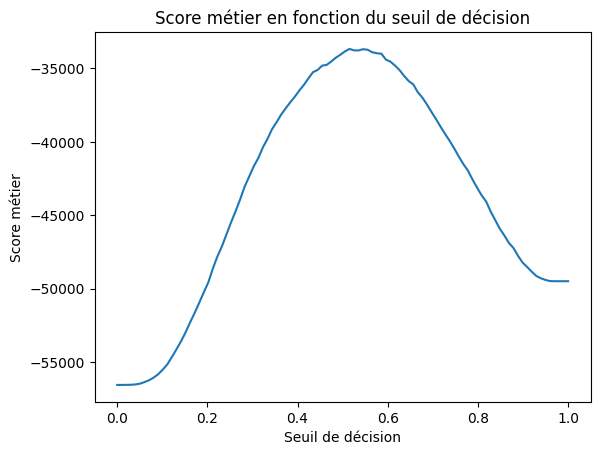

In [23]:
import matplotlib.pyplot as plt

thresholds = np.linspace(0, 1, num=100)  # Créer une plage de seuils

business_scores = []  # Liste pour stocker les scores métier correspondants à chaque seuil

for threshold in thresholds:
    y_pred_binary = (y_prob_test_optimized >= threshold).astype(int)  # Conversion en prédictions binaires avec le seuil
    business_score = calculate_business_score(y_test, y_pred_binary)  # Calcul du score métier
    business_scores.append(business_score)  # Ajout du score métier à la liste

# Affichage du graphe du score métier en fonction du seuil
plt.plot(thresholds, business_scores)
plt.xlabel('Seuil de décision')
plt.ylabel('Score métier')
plt.title('Score métier en fonction du seuil de décision')
plt.show()


In [23]:
import shap

# Initialiser l'explorateur SHAP avec votre modèle entraîné
explainer = shap.Explainer(model_optimized, X_train)


# Calculer les valeurs SHAP pour toutes les données d'entraînement
shap_values = explainer.shap_values(X_train)


In [26]:
import joblib

# Enregistrer les valeurs SHAP précalculées dans un fichier
joblib.dump(shap_values, 'shap_valuesxz.pkl', compress='xz')

['shap_valuesxz.pkl']

## Graphique shap

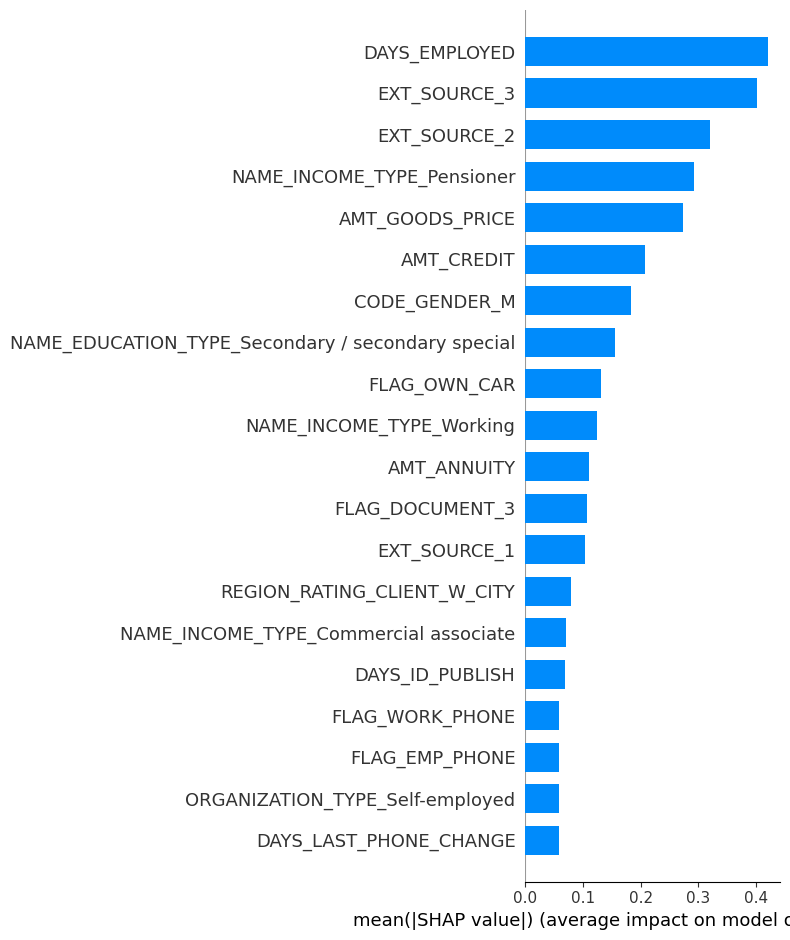

In [37]:
import shap
# Création de l'objet Explainer SHAP
explainer = shap.Explainer(grid_search.best_estimator_, X_train)

# Calcul des valeurs SHAP pour la colonne 'ENERGYSTARScore' dans les données d'entraînement
shap_values = explainer(X_train)

# Affichage du graphique SHAP pour la colonne 'ENERGYSTARScore'
shap.summary_plot(shap_values, X_train,plot_type="bar")



In [53]:
shap.initjs()

# Création de l'objet Explainer SHAP avec le modèle optimisé
explainer = shap.Explainer(model_optimized, X_train)

# Sélectionner une instance spécifique pour l'interprétation locale
instance = X_train[0:1]  # Sélectionner une seule ligne sous forme de DataFrame

# Calcul des valeurs SHAP pour l'instance sélectionnée
shap_values = explainer.shap_values(instance)

# Affichage du graphique SHAP pour l'instance sélectionnée
shap.force_plot(explainer.expected_value, shap_values, instance)


## Data Drift

In [20]:
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

old_df = train
new_df = X_test

# Créer le rapport de dérive des données
report = Report(metrics=[
    DataDriftPreset()])

# Ajouter les données de référence et les données actuelles
report.run(reference_data=old_df, current_data=new_df)


# Générer et afficher le rapport
report.show(mode='inline')


In [22]:
report.save_html("reports.html")